In [1]:
# get the environment
import sys
print(sys.version)
print(sys.executable)
import os
os.getcwd()

3.7.11 (default, Jul 27 2021, 09:42:29) [MSC v.1916 64 bit (AMD64)]
C:\Users\bbutler\MyStuff\Anaconda3\envs\reticulate\python.exe


'C:\\Users\\bbutler\\MyStuff\\MiscMarketing\\WebsiteFeedback'

In [126]:
# Standard imports
import sys
import warnings
warnings.simplefilter('ignore')
import os
import pandas as pd
import numpy as np

# plotting
from pylab import rcParams

import textwrap
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS # preprocessing prior to lda

# improve with plotly
import plotly.offline as pyo
from plotly.offline import iplot, init_notebook_mode
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode
import plotly.express as px
# print('Seaborn Version: ', sns.__version__)

# get UMAP for dimension reduction
import umap


%matplotlib inline

# for dendograms
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.cluster import hierarchy

# get the lDA algorithm
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.model_selection import GridSearchCV

# text libraries
import re
import nltk
from sklearn.feature_extraction.text import CountVectorizer
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# use the TF-IDF vectorizor to give more weight to rare words
# TF-IDF specific setup
from sklearn.feature_extraction.text import TfidfVectorizer

# set seed for reproducibility
SEED = 42


# for other work
import fnmatch


# for dendograms
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.cluster import hierarchy

# get the lDA algorithm
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.model_selection import GridSearchCV

# text libraries
import nltk
# nltk.download('stopwords')
from wordcloud import WordCloud, STOPWORDS # preprocessing prior to lda

# use the TF-IDF vectorizor to give more weight to rare words
# TF-IDF specific setup
from sklearn.feature_extraction.text import TfidfVectorizer

# tranformer pipeline for sentiment
from transformers import pipeline

# TF imports
import tensorflow_hub as hub
import tensorflow as tf

In [3]:
os.chdir('C:\\Users\\bbutler\\MyStuff\\MiscMarketing\\WebsiteFeedback\\RawData')

In [4]:
# get the CSV files only
files = fnmatch.filter(os.listdir('.'), '*.csv')
files

['Feedback Form Submissions 1.21.22.csv',
 'Feedback Form Submissions 1.25-1.31.22.csv',
 'Feedback Form Submissions 1.31-2.4.22.csv',
 'Feedback Form Submissions 2.11-2.18.22.csv',
 'Feedback Form Submissions 2.4.22-2.11.22.csv']

In [5]:
# create cleaner names for files in dictionary
# as this list of files grows, keep appending new data
# use a simple format
names = []
for i in range(0,len(files)):
    names.append('data' + str(i))
names

['data0', 'data1', 'data2', 'data3', 'data4']

In [6]:
# i is the incrementor for the list of names
i = 0

# iterate through the file names
for file in files:
    # make an empty dataframe
    df = pd.DataFrame()
    # load the first file in
    df = pd.read_csv(file, low_memory=False)
    # get the first name from the list, this will be a string
    new_name = names[i]
    # assign the string to the variable and assign it to the dataframe 
    locals()[new_name] = df.copy()
    # increment the list of names
    i = i + 1

# Use a Dictionary to Store & Compare DFs

In [7]:
# load them in via dictionary
dfs = {}

# this creates a dictionary of dataframes
for file in files:
    dfs[file] = pd.read_csv(file, low_memory=False)
    
dfs

{'Feedback Form Submissions 1.21.22.csv':      Serial number  Submission ID  \
 0              163         287926   
 1               99         287586   
 2              128         287731   
 3              137         287776   
 4               81         287496   
 ..             ...            ...   
 189             51         287326   
 190             52         287331   
 191             53         287336   
 192             54         287341   
 193             88         287531   
 
                                         Submission URI          Created  \
 0    /business-banking-bill-pay-error?status=16&sp=...  1/24/2022 12:07   
 1                                          /commercial   1/22/2022 9:53   
 2                   /credit-card-online-account-access  1/22/2022 21:31   
 3                   /credit-card-online-account-access  1/23/2022 12:58   
 4                                    /customer-service  1/21/2022 19:53   
 ..                                          

In [8]:
dfs = dict(zip(names, files))
dfs

{'data0': 'Feedback Form Submissions 1.21.22.csv',
 'data1': 'Feedback Form Submissions 1.25-1.31.22.csv',
 'data2': 'Feedback Form Submissions 1.31-2.4.22.csv',
 'data3': 'Feedback Form Submissions 2.11-2.18.22.csv',
 'data4': 'Feedback Form Submissions 2.4.22-2.11.22.csv'}

In [9]:
# now load the data in cleanly
for df in dfs.keys():
    dfs[df] = pd.read_csv(dfs[df], low_memory=False)

In [10]:
for k in dfs.keys():
    print(k, dfs[k].shape)

data0 (194, 23)
data1 (235, 23)
data2 (143, 23)
data3 (409, 22)
data4 (235, 22)


# Build Main Dataframe

In [11]:
# this checks for the IP address column then removes it

for i in range(0,len(names)):
        
    # get the first name from the list, this will be a string
    new_name = names[i]
    # assign the string to the variable and assign it to the dataframe
    if 'Remote IP address' in locals()[new_name].columns:
        print("Remote IP address exists in ", new_name, " removing now ...")
        locals()[new_name] = locals()[new_name].drop('Remote IP address', axis = 1)
    else:
        print("Remote IP address does not exist in ", new_name)

Remote IP address exists in  data0  removing now ...
Remote IP address exists in  data1  removing now ...
Remote IP address exists in  data2  removing now ...
Remote IP address does not exist in  data3
Remote IP address does not exist in  data4


In [12]:
# use a loop to concatenate all dataframes

df_list = []
for i in range(0,len(names)):
    df = names[i]
    df_list.append(locals()[df])
    
# now append the list
all_data = pd.concat(df_list, axis = 0)
all_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1216 entries, 0 to 234
Data columns (total 22 columns):
 #   Column                                                   Non-Null Count  Dtype  
---  ------                                                   --------------  -----  
 0   Serial number                                            1216 non-null   int64  
 1   Submission ID                                            1216 non-null   int64  
 2   Submission URI                                           1215 non-null   object 
 3   Created                                                  1216 non-null   object 
 4   Completed                                                1216 non-null   object 
 5   Changed                                                  1216 non-null   object 
 6   Is draft                                                 1216 non-null   int64  
 7   Current page                                             0 non-null      float64
 8   Submitted by: ID             

In [13]:
# key key fields
key_data = all_data[['Submission ID', 'Submission URI','Created',
                     'Did you find what you were looking for on this webpage?',
                     'Please tell us what you were looking for.']]

key_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1216 entries, 0 to 234
Data columns (total 5 columns):
 #   Column                                                   Non-Null Count  Dtype 
---  ------                                                   --------------  ----- 
 0   Submission ID                                            1216 non-null   int64 
 1   Submission URI                                           1215 non-null   object
 2   Created                                                  1216 non-null   object
 3   Did you find what you were looking for on this webpage?  1077 non-null   object
 4   Please tell us what you were looking for.                546 non-null    object
dtypes: int64(1), object(4)
memory usage: 57.0+ KB


In [14]:
# clean up names
new_names = ['ID', 'Page', 'Date', 'FindLookingFor', 'LookingFor']
key_data.columns = new_names
key_data.head()

,ID,Page,Date,FindLookingFor,LookingFor
0,287926,/business-banking-bill-pay-error?status=16&sp=...,1/24/2022 12:07,No,I am enrolled in Bill Pay. It stopped working ...
1,287586,/commercial,1/22/2022 9:53,No,how do i set up my commercial online banking
2,287731,/credit-card-online-account-access,1/22/2022 21:31,No,Credit card account on line login can not do w...
3,287776,/credit-card-online-account-access,1/23/2022 12:58,No,telephone number visa card
4,287496,/customer-service,1/21/2022 19:53,No,Account information.


In [15]:
# make a date
key_data['Date'] = pd.to_datetime(key_data['Date']).dt.date
key_data.head()

,ID,Page,Date,FindLookingFor,LookingFor
0,287926,/business-banking-bill-pay-error?status=16&sp=...,2022-01-24,No,I am enrolled in Bill Pay. It stopped working ...
1,287586,/commercial,2022-01-22,No,how do i set up my commercial online banking
2,287731,/credit-card-online-account-access,2022-01-22,No,Credit card account on line login can not do w...
3,287776,/credit-card-online-account-access,2022-01-23,No,telephone number visa card
4,287496,/customer-service,2022-01-21,No,Account information.


In [16]:
key_data['Date'] = pd.to_datetime(key_data['Date'], format = '%Y-%m-%d')
key_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1216 entries, 0 to 234
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   ID              1216 non-null   int64         
 1   Page            1215 non-null   object        
 2   Date            1216 non-null   datetime64[ns]
 3   FindLookingFor  1077 non-null   object        
 4   LookingFor      546 non-null    object        
dtypes: datetime64[ns](1), int64(1), object(3)
memory usage: 57.0+ KB


In [17]:
key_data.head()

,ID,Page,Date,FindLookingFor,LookingFor
0,287926,/business-banking-bill-pay-error?status=16&sp=...,2022-01-24,No,I am enrolled in Bill Pay. It stopped working ...
1,287586,/commercial,2022-01-22,No,how do i set up my commercial online banking
2,287731,/credit-card-online-account-access,2022-01-22,No,Credit card account on line login can not do w...
3,287776,/credit-card-online-account-access,2022-01-23,No,telephone number visa card
4,287496,/customer-service,2022-01-21,No,Account information.


In [18]:
plot_data = key_data[['Date', 'FindLookingFor']]
plot_data.head()

,Date,FindLookingFor
0,2022-01-24,No
1,2022-01-22,No
2,2022-01-22,No
3,2022-01-23,No
4,2022-01-21,No


In [19]:
plot_data['Count'] = 1
plot_data.head()

,Date,FindLookingFor,Count
0,2022-01-24,No,1
1,2022-01-22,No,1
2,2022-01-22,No,1
3,2022-01-23,No,1
4,2022-01-21,No,1


In [20]:
# make aggegate of Yes and no
yes_no = pd.DataFrame(plot_data.groupby(['Date', 'FindLookingFor']).aggregate({'Count' : np.sum}))
yes_no.head()

Count
Date       FindLookingFor       
2022-01-20 Yes                 2
2022-01-21 No                 14
           Yes                62
2022-01-22 No                 19
           Yes                26

In [21]:
yes_no = yes_no.reset_index()
yes_no.head()

,Date,FindLookingFor,Count
0,2022-01-20,Yes,2
1,2022-01-21,No,14
2,2022-01-21,Yes,62
3,2022-01-22,No,19
4,2022-01-22,Yes,26


In [22]:
# colors: dark blue,  sienna, blue, light blue, grey, green, 
colors = ["#04183C", "#E88202",  "#2A66DE", "#33BBFF", "#BAC2C6", "#179110"]

In [23]:
fig = px.bar(yes_no, x="Date",
             y="Count",
             color="FindLookingFor",
             title="Success Rates",
                color_discrete_map={
                    'No': colors[1],
                    'Yes': colors[0]},
            template="simple_white")

fig.update_xaxes(
    dtick=48*60*60*1000,
    tickformat="%b-%d",
    tickangle=-45)


fig.show()

In [24]:
# clean the page urls
key_data['Page'] = key_data['Page'].str.replace(r'(^.*403.*)', '/Broken-Link')
key_data['Page'] = key_data['Page'].str.replace(r'(^.*geo.*)', '/Map')

regex_pat = re.compile(r'\?.*', flags=re.IGNORECASE)
key_data['Page'] = key_data['Page'].str.replace(regex_pat, '', regex=True)


In [25]:
key_data.head(20)

,ID,Page,Date,FindLookingFor,LookingFor
0,287926,/business-banking-bill-pay-error,2022-01-24,No,I am enrolled in Bill Pay. It stopped working ...
1,287586,/commercial,2022-01-22,No,how do i set up my commercial online banking
2,287731,/credit-card-online-account-access,2022-01-22,No,Credit card account on line login can not do w...
3,287776,/credit-card-online-account-access,2022-01-23,No,telephone number visa card
4,287496,/customer-service,2022-01-21,No,Account information.
5,288011,/customer-service,2022-01-24,No,Where can I contact you for information on inc...
6,287881,/debit-alerts,2022-01-24,No,Vacation notification
7,287671,/direct-deposit,2022-01-22,No,i needed to speak to someone about ordering de...
8,287736,/eastern-bank-zelle,2022-01-22,No,What is the max $ amount you can send through ...
9,287771,/eastern-bank-zelle,2022-01-23,No,What are the transfer limits per day


# Plot Page Results over Time

In [26]:
plot_data = key_data[['Page', 'FindLookingFor']]
plot_data['Count'] = 1
plot_data.head()

,Page,FindLookingFor,Count
0,/business-banking-bill-pay-error,No,1
1,/commercial,No,1
2,/credit-card-online-account-access,No,1
3,/credit-card-online-account-access,No,1
4,/customer-service,No,1


In [27]:
# make aggegate of Yes and no
page_plot = pd.DataFrame(plot_data.groupby(['Page', 'FindLookingFor']).aggregate({'Count' : np.sum}))
page_plot.head()

Count
Page                              FindLookingFor       
/Broken-Link                      No                 49
                                  Yes               376
/Map                              No                 24
                                  Yes                10
/account-number-banking-statement No                  1

In [28]:
page_plot = page_plot.reset_index()

page_plot = page_plot.sort_values(by=['Count'],ascending=[False])

page_plot.head(20)

,Page,FindLookingFor,Count
1,/Broken-Link,Yes,376
132,/search,No,68
0,/Broken-Link,No,49
25,/customer-service,No,44
76,/online-banking,No,37
2,/Map,No,24
82,/online-services-0,No,21
50,/general-banking-faqs,No,19
14,/business-banking-bill-pay-error,Yes,18
22,/credit-card-online-account-access,Yes,18


In [29]:
fig = px.bar(page_plot.iloc[0:20,0:], x="Count",
             y="Page",
             color="FindLookingFor",
             title="Success Rates by Page (Top 20)",
                color_discrete_map={
                    'No': colors[1],
                    'Yes': colors[0]},
            template="simple_white")

fig.update_layout(barmode='stack', yaxis={'categoryorder':'total ascending'})

fig.show()

# Begin NLP

In [30]:
text = key_data[['Page', 'LookingFor']]
text.head(20)

,Page,LookingFor
0,/business-banking-bill-pay-error,I am enrolled in Bill Pay. It stopped working ...
1,/commercial,how do i set up my commercial online banking
2,/credit-card-online-account-access,Credit card account on line login can not do w...
3,/credit-card-online-account-access,telephone number visa card
4,/customer-service,Account information.
5,/customer-service,Where can I contact you for information on inc...
6,/debit-alerts,Vacation notification
7,/direct-deposit,i needed to speak to someone about ordering de...
8,/eastern-bank-zelle,What is the max $ amount you can send through ...
9,/eastern-bank-zelle,What are the transfer limits per day


In [31]:
# rename the columns
text.columns = ["Page", 'Comments']
text.head()

,Page,Comments
0,/business-banking-bill-pay-error,I am enrolled in Bill Pay. It stopped working ...
1,/commercial,how do i set up my commercial online banking
2,/credit-card-online-account-access,Credit card account on line login can not do w...
3,/credit-card-online-account-access,telephone number visa card
4,/customer-service,Account information.


In [32]:
# check NaN
text.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1216 entries, 0 to 234
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Page      1215 non-null   object
 1   Comments  546 non-null    object
dtypes: object(2)
memory usage: 28.5+ KB


In [33]:
# lots of NaN only get clean text
df = text[text['Comments'].notna()]
df.head()

,Page,Comments
0,/business-banking-bill-pay-error,I am enrolled in Bill Pay. It stopped working ...
1,/commercial,how do i set up my commercial online banking
2,/credit-card-online-account-access,Credit card account on line login can not do w...
3,/credit-card-online-account-access,telephone number visa card
4,/customer-service,Account information.


# Use CountVectorizer for Processing Comments into Bigrams
## Begin Cleaning Text

In [34]:
stopwords = nltk.corpus.stopwords.words('english')
stopwords

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [35]:
to_keep = ["couldn", "couldn't", "didn", "didn't", "doesn", "doesn't", "no", "more", "not", "can't",
           "cannot", "isn't", "aren't", "wasn't","weren't", "hasn't", "haven't", "hadn't", "doesn't",
           "don't", "didn't", "won't", "dont", "ain", "arent", "aren't", "hasn", "mightn", "mightn't",
           "mustn", "mustn't", 'on']

to_add = ['eastern', 'bank']


# remove the negative connotation stopwords
# check if to keep in the list, if so remove it
print("Stopwords length: ", len(stopwords))
for word in to_keep:
    if word in stopwords:
        # print(word, " in stopwords, removing  ...")
        stopwords.remove(word)
    else:
        print(word, " not in stopwords")

# add in eastern bank        
print("Stopwords length: ", len(stopwords))    
for word in to_add:
    #print("Adding ", word)
    stopwords.append(word)
    
print("Stopwords length: ", len(stopwords))

Stopwords length:  179
can't  not in stopwords
cannot  not in stopwords
doesn't  not in stopwords
didn't  not in stopwords
dont  not in stopwords
arent  not in stopwords
aren't  not in stopwords
Stopwords length:  154
Stopwords length:  156


In [36]:
# Additional Cleaning of Text
# Remove numbers
df['Clean_Comments'] = df['Comments'].replace(r'\d+','', regex=True, inplace=True)

# Remove punctuation
punct_pat = re.compile(r'[-()\"#/@;:<>{}+=~\.//,]', flags=re.IGNORECASE)
df['Clean_Comments'] = df['Comments'].str.replace(punct_pat, '', regex=True)

# convert to lower
# df['Clean_Comments'] = df['Clean_Comments'].str.lower()

df.head(20)

,Page,Comments,Clean_Comments
0,/business-banking-bill-pay-error,I am enrolled in Bill Pay. It stopped working ...,I am enrolled in Bill Pay It stopped working i...
1,/commercial,how do i set up my commercial online banking,how do i set up my commercial online banking
2,/credit-card-online-account-access,Credit card account on line login can not do w...,Credit card account on line login can not do w...
3,/credit-card-online-account-access,telephone number visa card,telephone number visa card
4,/customer-service,Account information.,Account information
5,/customer-service,Where can I contact you for information on inc...,Where can I contact you for information on inc...
6,/debit-alerts,Vacation notification,Vacation notification
7,/direct-deposit,i needed to speak to someone about ordering de...,i needed to speak to someone about ordering de...
8,/eastern-bank-zelle,What is the max $ amount you can send through ...,What is the max $ amount you can send through ...
9,/eastern-bank-zelle,What are the transfer limits per day,What are the transfer limits per day


In [37]:
# remove stopwords
df['Clean_Comments'] = df['Clean_Comments'].apply(lambda x: ' '.join([item for item in x.split() if item not in stopwords]))
df.head(20)

,Page,Comments,Clean_Comments
0,/business-banking-bill-pay-error,I am enrolled in Bill Pay. It stopped working ...,I enrolled Bill Pay It stopped working October...
1,/commercial,how do i set up my commercial online banking,set commercial online banking
2,/credit-card-online-account-access,Credit card account on line login can not do w...,Credit card account on line login not I go
3,/credit-card-online-account-access,telephone number visa card,telephone number visa card
4,/customer-service,Account information.,Account information
5,/customer-service,Where can I contact you for information on inc...,Where I contact information on incoming foreig...
6,/debit-alerts,Vacation notification,Vacation notification
7,/direct-deposit,i needed to speak to someone about ordering de...,needed speak someone ordering deposit slips pm...
8,/eastern-bank-zelle,What is the max $ amount you can send through ...,What max $ amount send zelle
9,/eastern-bank-zelle,What are the transfer limits per day,What transfer limits per day


# Build the Vectorizer

In [38]:
# set up for Bi-Grams

cv = CountVectorizer(max_df = 0.95, min_df=2, stop_words=stopwords, ngram_range=(2, 2))

In [39]:
# make document term matrix
dtm = cv.fit_transform(df['Clean_Comments'])
dtm

<546x140 sparse matrix of type '<class 'numpy.int64'>'
	with 374 stored elements in Compressed Sparse Row format>

In [40]:
dtm.shape

(546, 140)

In [41]:
# convert to dataframe for clustering
bow = pd.DataFrame(dtm.toarray(), columns = cv.get_feature_names())
bow

,access account,account balance,account holder,account information,account number,account per,ach transfer,address corporate,already enrolled,anywhere on,...,thank lisa,trying log,trying use,update password,user name,want know,want make,would like,years ago,zelle transfer
0,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
541,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
542,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
543,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
544,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [42]:
bow.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 546 entries, 0 to 545
Columns: 140 entries, access account to zelle transfer
dtypes: int64(140)
memory usage: 597.3 KB


In [43]:
bow['Page'] = df['Page'].values
bow.head()

,access account,account balance,account holder,account information,account number,account per,ach transfer,address corporate,already enrolled,anywhere on,...,trying log,trying use,update password,user name,want know,want make,would like,years ago,zelle transfer,Page
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,/business-banking-bill-pay-error
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,/commercial
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,/credit-card-online-account-access
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,/credit-card-online-account-access
4,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,/customer-service


In [44]:
# collapse it down
pageDf = bow.groupby(['Page']).sum()

In [45]:
# sum across rows
pageDf['Total'] = pageDf.sum(axis=1)
pageDf = pageDf.sort_values(by=['Total'],ascending=[False])
pageDf.head(25)

,access account,account balance,account holder,account information,account number,account per,ach transfer,address corporate,already enrolled,anywhere on,...,trying log,trying use,update password,user name,want know,want make,would like,years ago,zelle transfer,Total
Page,,,,,,,,,,,,,,,,,,,,,
/search,1,0,1,0,0,0,0,2,0,0,...,1,0,0,1,0,0,1,1,0,76
/customer-service,0,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,62
/Broken-Link,0,1,0,1,0,0,0,0,0,0,...,0,0,1,0,0,1,0,0,0,29
/online-banking,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,1,1,0,28
/general-banking-faqs,0,0,1,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,15
/business-banking-bill-pay-error,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,14
/online-services-0,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,13
/mobile-online-banking,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,11
/Map,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,10


In [46]:
pageDF = pageDf.drop('Total', axis=1)
pageDF.info()

<class 'pandas.core.frame.DataFrame'>
Index: 99 entries, /search to /personal-banking/home-loan-and-personal-borrowing
Columns: 140 entries, access account to zelle transfer
dtypes: int64(140)
memory usage: 109.1+ KB


In [47]:
page_red = pageDf.iloc[0:25,0:]
page_red.shape

(25, 141)

In [48]:
page_red = pageDf.iloc[0:25,0:]
page_red.shape

(25, 141)

In [49]:
# Calculate the distance between each sample
Z = linkage(page_red, 'ward')

In [50]:
# check the pages
l = list(page_red.index)
l

['/search',
 '/customer-service',
 '/Broken-Link',
 '/online-banking',
 '/general-banking-faqs',
 '/business-banking-bill-pay-error',
 '/online-services-0',
 '/mobile-online-banking',
 '/Map',
 '/welcome-century-bank-customers-0',
 '/credit-card-online-account-access',
 '/personal-banking/mortgages',
 '/talk2teller',
 '/debit-cards',
 '/eastern-bank-zelle',
 '/online-banking-faqs',
 '/goodchanges',
 '/savings-and-cds-0',
 '/personal-banking/mortgages/Refinancing-with-Eastern-Bank',
 '/aid-online',
 '/personal-banking/home-loan-and-personal-borrowing/eastern-bank-personal-line-of-credit',
 '/debit-cards-0',
 '/join-our-team-0',
 '/rate-center',
 '/our-team']

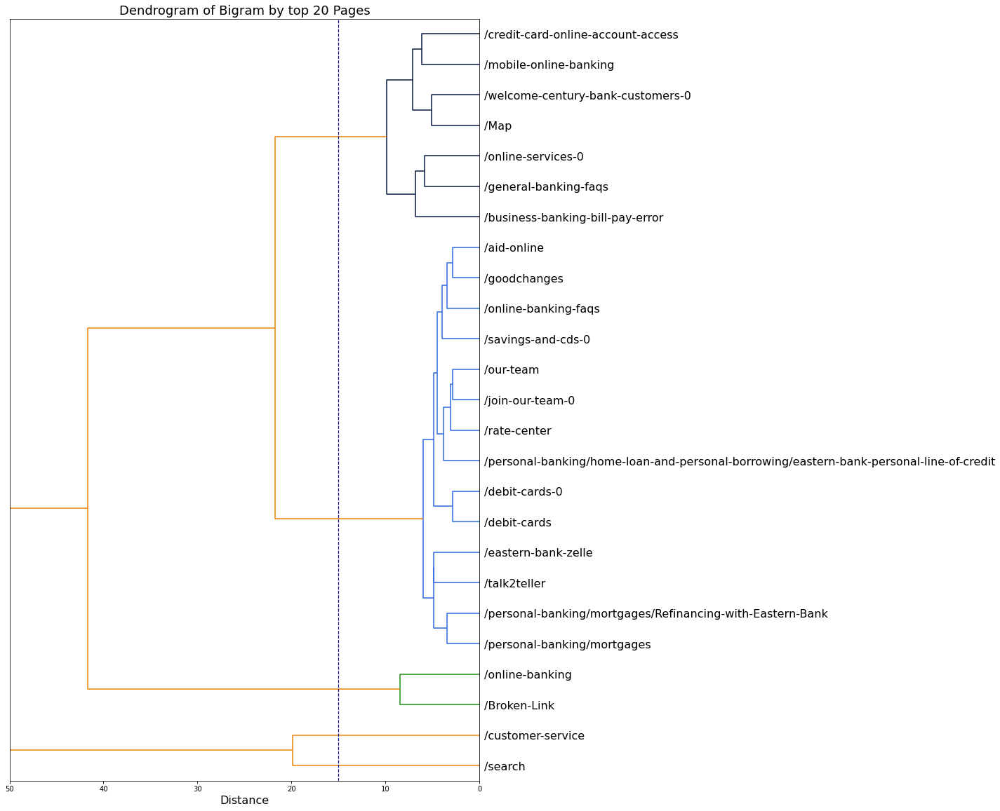

In [51]:
# set the threshold to color
# hierarchy.set_link_color_palette(['green', 'darkgrey', 'darkblue']) 
hierarchy.set_link_color_palette([colors[5], colors[2], colors[0]]) 

t = 15.0

plt.figure(figsize=(12,20))
dendrogram(Z, labels=l, leaf_rotation=0, leaf_font_size=16,
           orientation="left",
           color_threshold=t,
           above_threshold_color="#E88202")
plt.axvline(x=t, c='darkblue', lw=1.2, linestyle='dashed')
plt.title('Dendrogram of Bigram by top 20 Pages', fontsize=18)
# plt.xlabel('Page')
plt.xlabel('Distance', fontsize=16)
plt.xlim([50, 0])
plt.show()

# Topic Modeling with LDA

In [52]:
# function to do a grid search of params
def cv_lda(data_in):
    search_params = {'n_components':[4, 6, 8], "learning_decay":[0.3, 0.5, 0.7]}
    
    # initialize model
    LDA = LatentDirichletAllocation(random_state = SEED)
    
    # init grid search class
    model = GridSearchCV(LDA, param_grid = search_params).fit(data_in)
    
    # return best model
    print("Best Model's Params: ", model.best_params_)
    print("\nBest Log Likelihood: ", model.best_score_)
    print("\nBest Perplexity: ", model.best_estimator_.perplexity(data_in))
    model.best_estimator_

In [53]:
model = cv_lda(dtm)

Best Model's Params:  {'learning_decay': 0.3, 'n_components': 4}

Best Log Likelihood:  -700.2607001791085

Best Perplexity:  268.4340957516407


In [54]:
LDA = LatentDirichletAllocation(n_components=4, random_state=SEED, learning_decay=0.3)
LDA.fit(dtm)

LatentDirichletAllocation(learning_decay=0.3, n_components=4, random_state=42)

In [55]:
# grab the vocabulary of words
len(cv.get_feature_names())

140

In [56]:
LDA.components_.shape

(4, 140)

In [57]:
for index,topic in enumerate(LDA.components_):
    print(f'THE TOP 50 BIGRAMS WORDS FOR TOPIC #{index}')
    print([cv.get_feature_names()[i] for i in topic.argsort()[-50:]])
    print('\n')

THE TOP 50 BIGRAMS WORDS FOR TOPIC #0
['check deposit', 'access account', 'deposit information', 'per day', 'forgot password', 'reorder checks', 'lien release', 'customer statement', 'home page', 'open new', 'revolving credit', 'on loan', 'account per', 'thank lisa', 'talk someone', 'fdic insurance', 'on website', 'please send', 'closest branch', 'get account', 'branch manager', 'need form', 'tax info', 'login account', 'open account', 'telephone number', 'account number', 'interest rate', 'account information', 'account holder', 'not authorized', 'terms conditions', 'account balance', 'need get', 'need last', 'statements sent', 'current mortgage', 'on checking', 'loan information', 'looking page', 'ppp loan', 'change password', 'user name', 'overnight payoff', 'payoff address', 'live agent', 'would like', 'credit card', 'mortgage rates', 'checking account']


THE TOP 50 BIGRAMS WORDS FOR TOPIC #1
['ppp loan', 'pay bills', 'business banking', 'on hold', 'mobile app', 'online account', 

In [58]:
# outputs the probability of being in a group
topic_results = LDA.transform(dtm)
topic_results.shape

(546, 4)

In [59]:
# create a column for the topic assignment

df['Topic'] = topic_results.argmax(axis=1)
df.head(10)

,Page,Comments,Clean_Comments,Topic
0,/business-banking-bill-pay-error,I am enrolled in Bill Pay. It stopped working ...,I enrolled Bill Pay It stopped working October...,1
1,/commercial,how do i set up my commercial online banking,set commercial online banking,3
2,/credit-card-online-account-access,Credit card account on line login can not do w...,Credit card account on line login not I go,1
3,/credit-card-online-account-access,telephone number visa card,telephone number visa card,0
4,/customer-service,Account information.,Account information,0
5,/customer-service,Where can I contact you for information on inc...,Where I contact information on incoming foreig...,3
6,/debit-alerts,Vacation notification,Vacation notification,0
7,/direct-deposit,i needed to speak to someone about ordering de...,needed speak someone ordering deposit slips pm...,0
8,/eastern-bank-zelle,What is the max $ amount you can send through ...,What max $ amount send zelle,0
9,/eastern-bank-zelle,What are the transfer limits per day,What transfer limits per day,1


# Make Wordclouds of Topics

In [60]:
def get_words_freq(new_dtm):
    sum_words = new_dtm.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in cv.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq

In [119]:
# Generating wordcloud and saving as jpg image
def plot_cloud(title, words_freq):
    plt.figure(figsize=(16,10))
    
    title = 'Most frequently occurring bigrams connected by same colour and font size for ' + title

    words_dict = dict(words_freq)
    WC_height = 1500
    # WC_width = 2000
    WC_max_words = 500
    # wordCloud = WordCloud(max_words=WC_max_words, height=WC_height, width=WC_width,stopwords=stopwords)
    wordCloud = WordCloud(max_words=WC_max_words,stopwords=stopwords)
    wordCloud.generate_from_frequencies(words_dict)
    plt.title(title, fontsize=24)
    plt.imshow(wordCloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

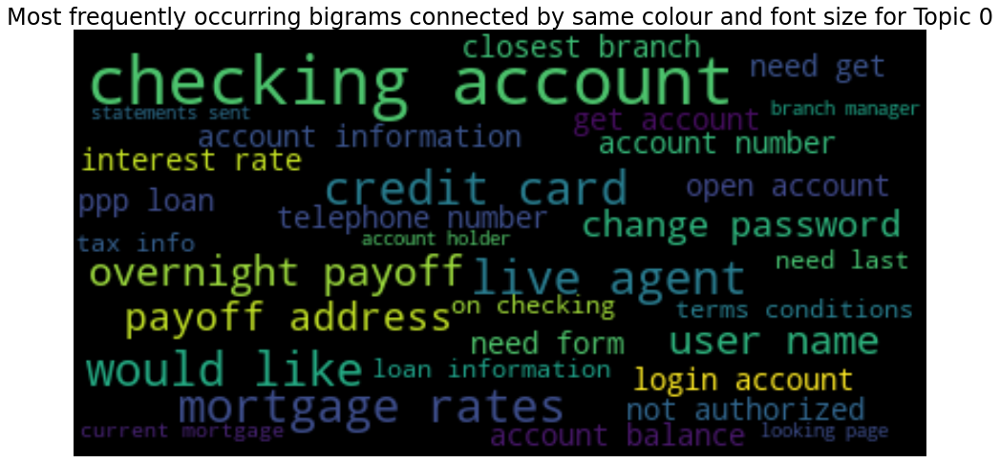

In [120]:
# topic 0
# make document term matrix

df0 = df[df['Topic'] == 0]
dtm0 = cv.fit_transform(df0['Clean_Comments'])
wf = get_words_freq(dtm0)
plot_cloud("Topic 0", wf)

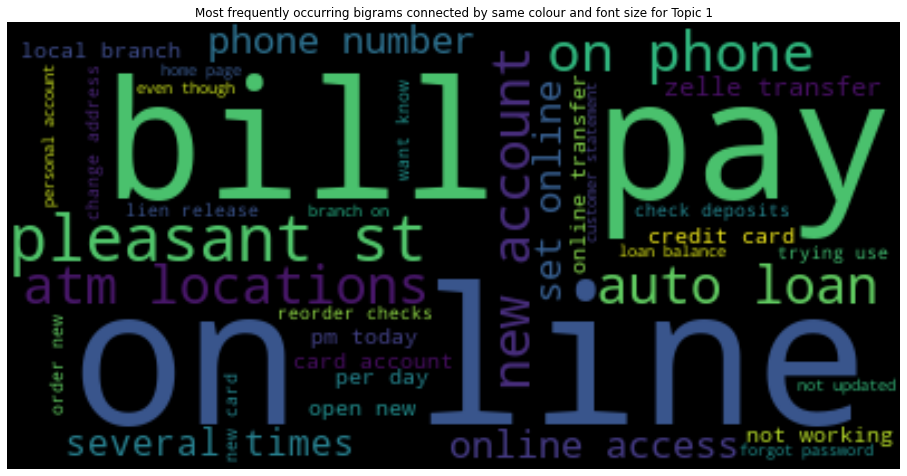

In [63]:
# topic 1
# make document term matrix

df1 = df[df['Topic'] == 1]
dtm1 = cv.fit_transform(df1['Clean_Comments'])

wf = get_words_freq(dtm1)
plot_cloud("Topic 1", wf)

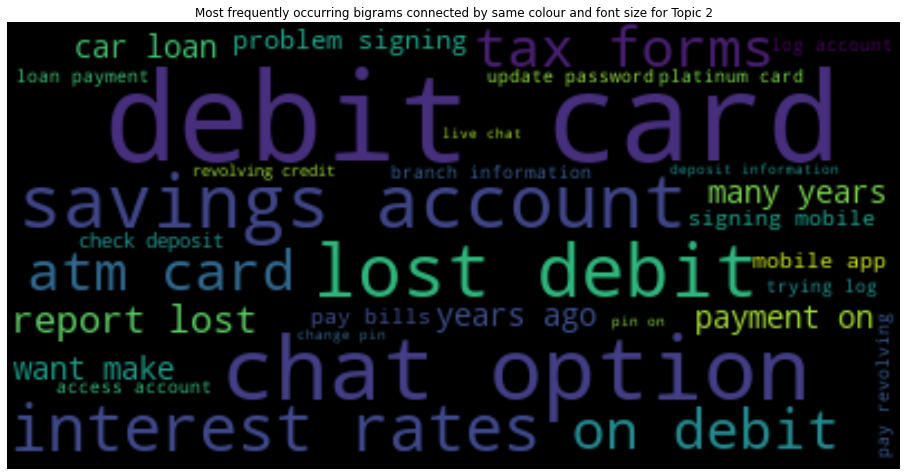

In [64]:
df2 = df[df['Topic'] == 2]
dtm2 = cv.fit_transform(df2['Clean_Comments'])

wf = get_words_freq(dtm2)
plot_cloud("Topic 2", wf)

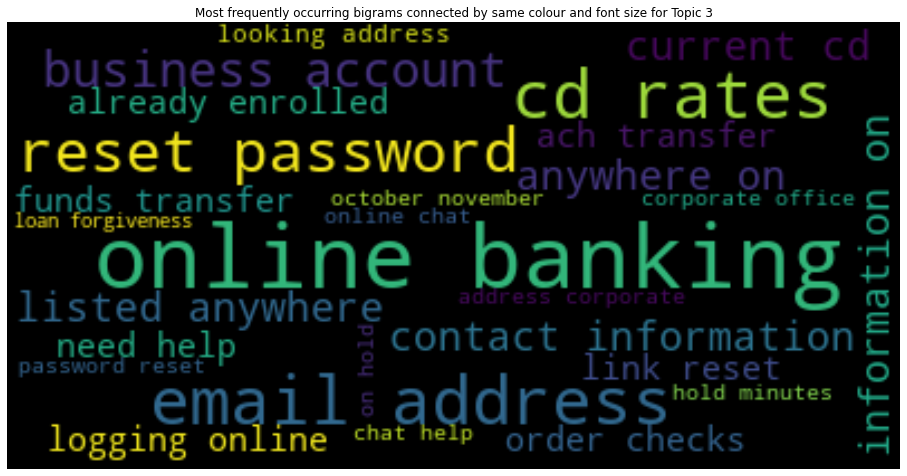

In [65]:
df3 = df[df['Topic'] == 3]
dtm3 = cv.fit_transform(df3['Clean_Comments'])
wf = get_words_freq(dtm3)
plot_cloud("Topic 3", wf)

In [66]:
# map with words this is just a high level pass you'll have to study it more
mytopic_dict = {0:'Account Inquiries',1:'Online Banking',2:'Cards & Payments',3:'General'}

df['Topic_Label'] = df['Topic'].map(mytopic_dict)
df.head(10)

,Page,Comments,Clean_Comments,Topic,Topic_Label
0,/business-banking-bill-pay-error,I am enrolled in Bill Pay. It stopped working ...,I enrolled Bill Pay It stopped working October...,1,Online Banking
1,/commercial,how do i set up my commercial online banking,set commercial online banking,3,General
2,/credit-card-online-account-access,Credit card account on line login can not do w...,Credit card account on line login not I go,1,Online Banking
3,/credit-card-online-account-access,telephone number visa card,telephone number visa card,0,Account Inquiries
4,/customer-service,Account information.,Account information,0,Account Inquiries
5,/customer-service,Where can I contact you for information on inc...,Where I contact information on incoming foreig...,3,General
6,/debit-alerts,Vacation notification,Vacation notification,0,Account Inquiries
7,/direct-deposit,i needed to speak to someone about ordering de...,needed speak someone ordering deposit slips pm...,0,Account Inquiries
8,/eastern-bank-zelle,What is the max $ amount you can send through ...,What max $ amount send zelle,0,Account Inquiries
9,/eastern-bank-zelle,What are the transfer limits per day,What transfer limits per day,1,Online Banking


# Topic Plot

In [67]:
# Generate the TF-IDF vectors
# this is the same step as earlier with the count vectorizer
vectorizer_tfidf = TfidfVectorizer(max_features=10000, ngram_range = (2,2))
vectors_tfidf = vectorizer_tfidf.fit_transform(df.Clean_Comments)
print(vectors_tfidf.shape)

(546, 1987)


In [68]:
# Generate the TF-IDF dimension reduction
embedding_tfidf = umap.UMAP(random_state=SEED).fit_transform(vectors_tfidf)

In [69]:
def enable_plotly_in_cell():
  import IPython
  display(IPython.core.display.HTML('''<script src="/static/components/requirejs/require.js"></script>'''))
  init_notebook_mode(connected=False)

In [70]:
# set up plotting

df['x'] = embedding_tfidf[:,0]
df['y'] = embedding_tfidf[:,1]

# Wrap the text so it displays nicely in Plotly hover
df['wrap'] = df['Comments'].map(lambda x: '<br>'.join(textwrap.wrap(x, 64)))

df.head()


,Page,Comments,Clean_Comments,Topic,Topic_Label,x,y,wrap
0,/business-banking-bill-pay-error,I am enrolled in Bill Pay. It stopped working ...,I enrolled Bill Pay It stopped working October...,1,Online Banking,23.794918,-2.434377,I am enrolled in Bill Pay. It stopped working ...
1,/commercial,how do i set up my commercial online banking,set commercial online banking,3,General,20.601254,-2.167869,how do i set up my commercial online banking
2,/credit-card-online-account-access,Credit card account on line login can not do w...,Credit card account on line login not I go,1,Online Banking,18.850674,-4.185966,Credit card account on line login can not do w...
3,/credit-card-online-account-access,telephone number visa card,telephone number visa card,0,Account Inquiries,19.497881,-4.994414,telephone number visa card
4,/customer-service,Account information.,Account information,0,Account Inquiries,19.659647,-2.468903,Account information.


In [71]:
df.y.max()

8.020306587219238

In [72]:
colors = ['darkblue', 'orange', 'blue', 'green']
topics = list(df['Topic_Label'].unique())
topics

['Online Banking', 'General', 'Account Inquiries', 'Cards & Payments']

In [73]:
enable_plotly_in_cell()

fig = go.Figure()


for i, topic in enumerate(topics):
    ix = df[df['Topic_Label'] == topic]
    fig.add_trace(go.Scatter(x=ix.x,
                             y=ix.y,
                             name=topic,
                             showlegend=True,
                             mode='markers',
                             marker=dict(
                                 color=colors[i],
                                 size=4,
                                 opacity = 0.6),
                             hovertemplate='Page: ' + ix.Page + '<br>' + 'Topic: ' + ix['Topic_Label'] + '<br>' + 
                             "Comments: " + ix.wrap + '<extra></extra>'
                            ))


   
fig.update_layout(
    autosize=False,
    width=1000,
    height=800,
    hovermode="closest",
    title="Comment Clusters using Bigrams",
    legend_title_text='Topic',
    scene = dict(
        xaxis = dict(title=' ',visible=True, backgroundcolor="rgb(200, 200, 230)", tickvals=[]),
        yaxis = dict(title=' ',visible=True, backgroundcolor="rgb(200, 200, 230)", tickvals=[]),
    ),
    yaxis_range=[-6,10]
)


fig.update_layout(
    yaxis=dict(showticklabels=False),
    xaxis=dict(showticklabels=False)
)



 
    
fig.update_layout(legend=dict(
    orientation="h",
    yanchor="bottom",
    y=1.02,
    xanchor="right",
    x=1
))

    


iplot(fig)

# Sentiment Analysis

## Sentiment Scoring with Vader

In [74]:
# instantiate sentiment engine
sid = SentimentIntensityAnalyzer()

In [75]:
# apply the sentiment analyzer
df['Scores'] = df['Clean_Comments'].apply(lambda review: sid.polarity_scores(review))

# compound scores
df['Compound'] = df['Scores'].apply(lambda d:d['compound'])
df.head()

,Page,Comments,Clean_Comments,Topic,Topic_Label,x,y,wrap,Scores,Compound
0,/business-banking-bill-pay-error,I am enrolled in Bill Pay. It stopped working ...,I enrolled Bill Pay It stopped working October...,1,Online Banking,23.794918,-2.434377,I am enrolled in Bill Pay. It stopped working ...,"{'neg': 0.156, 'neu': 0.775, 'pos': 0.069, 'co...",-0.7912
1,/commercial,how do i set up my commercial online banking,set commercial online banking,3,General,20.601254,-2.167869,how do i set up my commercial online banking,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000
2,/credit-card-online-account-access,Credit card account on line login can not do w...,Credit card account on line login not I go,1,Online Banking,18.850674,-4.185966,Credit card account on line login can not do w...,"{'neg': 0.0, 'neu': 0.729, 'pos': 0.271, 'comp...",0.3818
3,/credit-card-online-account-access,telephone number visa card,telephone number visa card,0,Account Inquiries,19.497881,-4.994414,telephone number visa card,"{'neg': 0.0, 'neu': 0.698, 'pos': 0.302, 'comp...",0.0772
4,/customer-service,Account information.,Account information,0,Account Inquiries,19.659647,-2.468903,Account information.,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000


In [76]:
# add some context
# you can choose scores fore neutral (-1 to 1 or something like that)
def sentiment_score(row):
    if row >= .25:
        return 'Pos'
    elif row <= -.25:
        return 'Neg'
    else:
        return "Neu"

In [77]:
df['Sentiment'] = df['Compound'].apply(sentiment_score)

df.head(20)

,Page,Comments,Clean_Comments,Topic,Topic_Label,x,y,wrap,Scores,Compound,Sentiment
0,/business-banking-bill-pay-error,I am enrolled in Bill Pay. It stopped working ...,I enrolled Bill Pay It stopped working October...,1,Online Banking,23.794918,-2.434377,I am enrolled in Bill Pay. It stopped working ...,"{'neg': 0.156, 'neu': 0.775, 'pos': 0.069, 'co...",-0.7912,Neg
1,/commercial,how do i set up my commercial online banking,set commercial online banking,3,General,20.601254,-2.167869,how do i set up my commercial online banking,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000,Neu
2,/credit-card-online-account-access,Credit card account on line login can not do w...,Credit card account on line login not I go,1,Online Banking,18.850674,-4.185966,Credit card account on line login can not do w...,"{'neg': 0.0, 'neu': 0.729, 'pos': 0.271, 'comp...",0.3818,Pos
3,/credit-card-online-account-access,telephone number visa card,telephone number visa card,0,Account Inquiries,19.497881,-4.994414,telephone number visa card,"{'neg': 0.0, 'neu': 0.698, 'pos': 0.302, 'comp...",0.0772,Neu
4,/customer-service,Account information.,Account information,0,Account Inquiries,19.659647,-2.468903,Account information.,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000,Neu
5,/customer-service,Where can I contact you for information on inc...,Where I contact information on incoming foreig...,3,General,20.165277,-4.701475,Where can I contact you for information on inc...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000,Neu
6,/debit-alerts,Vacation notification,Vacation notification,0,Account Inquiries,20.330042,-5.038855,Vacation notification,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000,Neu
7,/direct-deposit,i needed to speak to someone about ordering de...,needed speak someone ordering deposit slips pm...,0,Account Inquiries,20.282848,-1.973689,i needed to speak to someone about ordering de...,"{'neg': 0.0, 'neu': 0.954, 'pos': 0.046, 'comp...",0.0258,Neu
8,/eastern-bank-zelle,What is the max $ amount you can send through ...,What max $ amount send zelle,0,Account Inquiries,20.814640,-4.747118,What is the max $ amount you can send through ...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000,Neu
9,/eastern-bank-zelle,What are the transfer limits per day,What transfer limits per day,1,Online Banking,19.842552,-5.086382,What are the transfer limits per day,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000,Neu


## Transformers

In [78]:
# tranformer pipeline for sentiment
from transformers import pipeline

In [79]:
sent_analysis = pipeline("sentiment-analysis")

No model was supplied, defaulted to distilbert-base-uncased-finetuned-sst-2-english (https://huggingface.co/distilbert-base-uncased-finetuned-sst-2-english)


In [80]:
def get_sent_label(text):
    result = sent_analysis(text)[0]
    return result['label']

In [81]:
def get_sent_conf(text):
    result = sent_analysis(text)[0]
    return result['score']

In [82]:
df['Transformer_Label'] = df['Comments'].apply(get_sent_label)
df.head()

,Page,Comments,Clean_Comments,Topic,Topic_Label,x,y,wrap,Scores,Compound,Sentiment,Transformer_Label
0,/business-banking-bill-pay-error,I am enrolled in Bill Pay. It stopped working ...,I enrolled Bill Pay It stopped working October...,1,Online Banking,23.794918,-2.434377,I am enrolled in Bill Pay. It stopped working ...,"{'neg': 0.156, 'neu': 0.775, 'pos': 0.069, 'co...",-0.7912,Neg,NEGATIVE
1,/commercial,how do i set up my commercial online banking,set commercial online banking,3,General,20.601254,-2.167869,how do i set up my commercial online banking,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000,Neu,NEGATIVE
2,/credit-card-online-account-access,Credit card account on line login can not do w...,Credit card account on line login not I go,1,Online Banking,18.850674,-4.185966,Credit card account on line login can not do w...,"{'neg': 0.0, 'neu': 0.729, 'pos': 0.271, 'comp...",0.3818,Pos,NEGATIVE
3,/credit-card-online-account-access,telephone number visa card,telephone number visa card,0,Account Inquiries,19.497881,-4.994414,telephone number visa card,"{'neg': 0.0, 'neu': 0.698, 'pos': 0.302, 'comp...",0.0772,Neu,NEGATIVE
4,/customer-service,Account information.,Account information,0,Account Inquiries,19.659647,-2.468903,Account information.,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000,Neu,POSITIVE


In [83]:
df['Transformer_Conf'] = df['Comments'].apply(get_sent_conf)
df.head()

,Page,Comments,Clean_Comments,Topic,Topic_Label,x,y,wrap,Scores,Compound,Sentiment,Transformer_Label,Transformer_Conf
0,/business-banking-bill-pay-error,I am enrolled in Bill Pay. It stopped working ...,I enrolled Bill Pay It stopped working October...,1,Online Banking,23.794918,-2.434377,I am enrolled in Bill Pay. It stopped working ...,"{'neg': 0.156, 'neu': 0.775, 'pos': 0.069, 'co...",-0.7912,Neg,NEGATIVE,0.999565
1,/commercial,how do i set up my commercial online banking,set commercial online banking,3,General,20.601254,-2.167869,how do i set up my commercial online banking,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000,Neu,NEGATIVE,0.996917
2,/credit-card-online-account-access,Credit card account on line login can not do w...,Credit card account on line login not I go,1,Online Banking,18.850674,-4.185966,Credit card account on line login can not do w...,"{'neg': 0.0, 'neu': 0.729, 'pos': 0.271, 'comp...",0.3818,Pos,NEGATIVE,0.998949
3,/credit-card-online-account-access,telephone number visa card,telephone number visa card,0,Account Inquiries,19.497881,-4.994414,telephone number visa card,"{'neg': 0.0, 'neu': 0.698, 'pos': 0.302, 'comp...",0.0772,Neu,NEGATIVE,0.791163
4,/customer-service,Account information.,Account information,0,Account Inquiries,19.659647,-2.468903,Account information.,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000,Neu,POSITIVE,0.853706


# Transformer Sentiment by Topic

In [108]:
os.chdir("../CleanDataFrames")
os.getcwd()

'C:\\Users\\bbutler\\MyStuff\\MiscMarketing\\WebsiteFeedback\\CleanDataFrames'

In [113]:
df.to_csv('df.csv')

In [127]:
px_col = ['#E88202', '#04183C', '#E88202', '#04183C']

fig = go.Figure()

for i, sentiment in enumerate(df['Transformer_Label'].unique()):
    df_plot=df[df['Transformer_Label']==sentiment]
    
    fig.add_trace(go.Box(x=df_plot['Topic_Label'],
                         y=df_plot['Transformer_Conf'],
                         notched=False,
                         line=dict(color='blue'),
                         #line=dict(color=colors[i]),
                         #fillcolor='yellow',
                         fillcolor=px_col[i],
                         # line=dict(color = px_col[i]),
                         name = sentiment,
                         
                         ))
    
fig.update_layout(boxmode='group',
                  xaxis_tickangle=0,
                  template="simple_white",
                  yaxis_title='Sentiment Confidence')
# fig.show()

# this will save it as a .html file
# testplot = pyo.plot(fig, filename='testTrans.html', auto_open=False)

# Create Blended Sentiment Score

In [85]:
sent_df = df[['Page', 'Comments', 'Topic_Label', 'Compound', 'Transformer_Label', 'Transformer_Conf']]
sent_df.head()

,Page,Comments,Topic_Label,Compound,Transformer_Label,Transformer_Conf
0,/business-banking-bill-pay-error,I am enrolled in Bill Pay. It stopped working ...,Online Banking,-0.7912,NEGATIVE,0.999565
1,/commercial,how do i set up my commercial online banking,General,0.0000,NEGATIVE,0.996917
2,/credit-card-online-account-access,Credit card account on line login can not do w...,Online Banking,0.3818,NEGATIVE,0.998949
3,/credit-card-online-account-access,telephone number visa card,Account Inquiries,0.0772,NEGATIVE,0.791163
4,/customer-service,Account information.,Account Inquiries,0.0000,POSITIVE,0.853706


In [86]:
sent_df['Count'] = 1

In [87]:
# get the number of words in comments
sent_df['Word_Count'] = sent_df['Comments'].str.count(' ').add(1)
sent_df.head()

,Page,Comments,Topic_Label,Compound,Transformer_Label,Transformer_Conf,Count,Word_Count
0,/business-banking-bill-pay-error,I am enrolled in Bill Pay. It stopped working ...,Online Banking,-0.7912,NEGATIVE,0.999565,1,146
1,/commercial,how do i set up my commercial online banking,General,0.0000,NEGATIVE,0.996917,1,9
2,/credit-card-online-account-access,Credit card account on line login can not do w...,Online Banking,0.3818,NEGATIVE,0.998949,1,13
3,/credit-card-online-account-access,telephone number visa card,Account Inquiries,0.0772,NEGATIVE,0.791163,1,4
4,/customer-service,Account information.,Account Inquiries,0.0000,POSITIVE,0.853706,1,3


In [88]:
# make rules to blend sentiment

def blend_sentiment(df):
    if (df['Compound'] < 0 and df['Transformer_Label'] == 'NEGATIVE'):
        return df['Compound']
    elif (df['Compound'] > 0 and df['Transformer_Label'] == 'NEGATIVE'):
        return df['Compound'] * -1
    elif (df['Compound'] == 0 and df['Transformer_Label'] == 'NEGATIVE'):
        return (1 - df['Transformer_Conf'] - (df['Word_Count']/100))
    elif (df['Compound'] > 0 and df['Transformer_Label'] == 'POSITIVE'):
        return df['Compound']
    elif (df['Compound'] == 0 and df['Transformer_Label'] == 'POSITIVE'):
        return (1 - df['Transformer_Conf'] + (df['Word_Count']/100))
    elif (df['Compound'] < 0 and df['Transformer_Label'] == 'POSITIVE'):
        return df['Compound'] + df['Transformer_Conf'] - (df['Word_Count']/100)

In [89]:
# apply the rule

sent_df['Blend_Score'] = sent_df.apply(blend_sentiment, axis = 1)
sent_df.head(20)

,Page,Comments,Topic_Label,Compound,Transformer_Label,Transformer_Conf,Count,Word_Count,Blend_Score
0,/business-banking-bill-pay-error,I am enrolled in Bill Pay. It stopped working ...,Online Banking,-0.7912,NEGATIVE,0.999565,1,146,-0.791200
1,/commercial,how do i set up my commercial online banking,General,0.0000,NEGATIVE,0.996917,1,9,-0.086917
2,/credit-card-online-account-access,Credit card account on line login can not do w...,Online Banking,0.3818,NEGATIVE,0.998949,1,13,-0.381800
3,/credit-card-online-account-access,telephone number visa card,Account Inquiries,0.0772,NEGATIVE,0.791163,1,4,-0.077200
4,/customer-service,Account information.,Account Inquiries,0.0000,POSITIVE,0.853706,1,3,0.176294
5,/customer-service,Where can I contact you for information on inc...,General,0.0000,NEGATIVE,0.994013,1,12,-0.114013
6,/debit-alerts,Vacation notification,Account Inquiries,0.0000,POSITIVE,0.956160,1,3,0.073840
7,/direct-deposit,i needed to speak to someone about ordering de...,Account Inquiries,0.0258,NEGATIVE,0.998765,1,57,-0.025800
8,/eastern-bank-zelle,What is the max $ amount you can send through ...,Account Inquiries,0.0000,NEGATIVE,0.991954,1,12,-0.111954
9,/eastern-bank-zelle,What are the transfer limits per day,Online Banking,0.0000,NEGATIVE,0.964391,1,8,-0.044391


In [90]:
# add some context
# you can choose scores fore neutral (-1 to 1 or something like that)
def sentiment_score(row):
    if row >= .25:
        return 'Pos'
    elif row <= -.25:
        return 'Neg'
    else:
        return "Neu"

In [91]:
# rebin the sentiment
sent_df['Blend_Sent'] = sent_df['Blend_Score'].apply(sentiment_score)
sent_df.head()

,Page,Comments,Topic_Label,Compound,Transformer_Label,Transformer_Conf,Count,Word_Count,Blend_Score,Blend_Sent
0,/business-banking-bill-pay-error,I am enrolled in Bill Pay. It stopped working ...,Online Banking,-0.7912,NEGATIVE,0.999565,1,146,-0.791200,Neg
1,/commercial,how do i set up my commercial online banking,General,0.0000,NEGATIVE,0.996917,1,9,-0.086917,Neu
2,/credit-card-online-account-access,Credit card account on line login can not do w...,Online Banking,0.3818,NEGATIVE,0.998949,1,13,-0.381800,Neg
3,/credit-card-online-account-access,telephone number visa card,Account Inquiries,0.0772,NEGATIVE,0.791163,1,4,-0.077200,Neu
4,/customer-service,Account information.,Account Inquiries,0.0000,POSITIVE,0.853706,1,3,0.176294,Neu


In [92]:
# get the counts and roll them up
sent_plot = pd.DataFrame(sent_df.groupby(['Topic_Label', 'Blend_Sent'], as_index=False).aggregate({'Count' : np.sum}))
sent_plot.head(10)

,Topic_Label,Blend_Sent,Count
0,Account Inquiries,Neg,39
1,Account Inquiries,Neu,219
2,Account Inquiries,Pos,117
3,Cards & Payments,Neg,18
4,Cards & Payments,Neu,36
5,Cards & Payments,Pos,6
6,General,Neg,8
7,General,Neu,33
8,General,Pos,9
9,Online Banking,Neg,17


In [110]:
# export two key Df
sent_plot.to_csv('sent_plot.csv')
sent_df.to_csv('sent_df.csv')

In [112]:
# test
loc = 'M:\\bbutler\\DataScience\\NLP\\WebsiteFeedback\\CleanDataFrames'
loc_file = loc + '\\sent_plot.csv'

test = pd.read_csv(loc_file)
test.head()

,Unnamed: 0,Topic_Label,Blend_Sent,Count
0,0,Account Inquiries,Neg,39
1,1,Account Inquiries,Neu,219
2,2,Account Inquiries,Pos,117
3,3,Cards & Payments,Neg,18
4,4,Cards & Payments,Neu,36


In [93]:
px_col = ['#FF7F24','#2A66DE', '#179110']


fig = px.bar(sent_plot, x="Topic_Label",
             y="Count",
             color="Blend_Sent",
             title="Blended Sentiment by Topic",
                color_discrete_map={
                    'Neg': px_col[0],
                    'Pos': px_col[2],
                    'Neu': px_col[1]})

fig.update_layout(barmode='group',
                  xaxis_tickangle=0,
                  template="simple_white",
                  yaxis_title='Count')

fig.show()

# Google Universal Sentence Encoder

In [94]:
text = sent_df['Comments'].to_list()
len(text)

546

In [95]:
# get the sentences
# np_list = np.asarray(sentence_list) and then convert it to tensor using
# tensor_list = tf.convert_to_tensor(np_list)

np_list = np.asarray(text)
sentences = tf.convert_to_tensor(np_list)
sentences

<tf.Tensor: shape=(546,), dtype=string, numpy=
array([b"I am enrolled in Bill Pay. It stopped working in October and I had to go to my local branch where the manager got IT on the phone and got it working again. It is not working again today and gives me an error message that I am not registered for bill payment service (I have registered twice since opening this account). I have called -- but it stops ringing and goes dead - the last attempt was at :pm today. I tried your online texting service and the attendant named Edily said they would email someone and have someone call me. This is not good enough. We are ready to move our accounts away from Eastern at this point as we've never had bill pay access when we need it and the service these past  weeks has been deplorable. Thank you. Lisa Tapp --",
       b'how do i set up my commercial online banking',
       b'Credit card account on line login can not do where do I go',
       b'telephone number visa card', b'Account information. ',


In [96]:
end = sentences.shape
end

TensorShape([546])

In [97]:
# Load the GUSE model
guse = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")

In [98]:
# encode them all
vectors_guse = guse(sentences)
print(vectors_guse.shape)

(546, 512)


In [99]:
# Generate the GUSE dimension reductions
embedding_guse = umap.UMAP(random_state=SEED, n_components = 2).fit_transform(vectors_guse)

In [100]:
# Wrap the text so it displays nicely in Plotly hover
sent_df['wrap'] = sent_df['Comments'].map(lambda x: '<br>'.join(textwrap.wrap(x, 64)))

In [101]:
# set up sentiment as z axis
sent_df['x'] = embedding_guse[:,0]
sent_df['y'] = embedding_guse[:,1]
sent_df['z'] = sent_df['Blend_Score']

sent_df.head(10)

,Page,Comments,Topic_Label,Compound,Transformer_Label,Transformer_Conf,Count,Word_Count,Blend_Score,Blend_Sent,wrap,x,y,z
0,/business-banking-bill-pay-error,I am enrolled in Bill Pay. It stopped working ...,Online Banking,-0.7912,NEGATIVE,0.999565,1,146,-0.791200,Neg,I am enrolled in Bill Pay. It stopped working ...,-1.897833,15.363493,-0.791200
1,/commercial,how do i set up my commercial online banking,General,0.0000,NEGATIVE,0.996917,1,9,-0.086917,Neu,how do i set up my commercial online banking,-2.130736,14.326793,-0.086917
2,/credit-card-online-account-access,Credit card account on line login can not do w...,Online Banking,0.3818,NEGATIVE,0.998949,1,13,-0.381800,Neg,Credit card account on line login can not do w...,-2.890923,14.743116,-0.381800
3,/credit-card-online-account-access,telephone number visa card,Account Inquiries,0.0772,NEGATIVE,0.791163,1,4,-0.077200,Neu,telephone number visa card,-0.398661,13.556530,-0.077200
4,/customer-service,Account information.,Account Inquiries,0.0000,POSITIVE,0.853706,1,3,0.176294,Neu,Account information.,-0.632369,12.421791,0.176294
5,/customer-service,Where can I contact you for information on inc...,General,0.0000,NEGATIVE,0.994013,1,12,-0.114013,Neu,Where can I contact you for information on inc...,-2.512047,15.357286,-0.114013
6,/debit-alerts,Vacation notification,Account Inquiries,0.0000,POSITIVE,0.956160,1,3,0.073840,Neu,Vacation notification,-1.221997,12.304081,0.073840
7,/direct-deposit,i needed to speak to someone about ordering de...,Account Inquiries,0.0258,NEGATIVE,0.998765,1,57,-0.025800,Neu,i needed to speak to someone about ordering de...,-1.671376,15.548177,-0.025800
8,/eastern-bank-zelle,What is the max $ amount you can send through ...,Account Inquiries,0.0000,NEGATIVE,0.991954,1,12,-0.111954,Neu,What is the max $ amount you can send through ...,-3.068583,13.924637,-0.111954
9,/eastern-bank-zelle,What are the transfer limits per day,Online Banking,0.0000,NEGATIVE,0.964391,1,8,-0.044391,Neu,What are the transfer limits per day,-4.110167,14.607345,-0.044391


In [102]:
sent_df['Word_Count'].head()

0    146
1      9
2     13
3      4
4      3
Name: Word_Count, dtype: int64

In [103]:
# [unicode(x.strip()) if x is not None else '' for x in row]

sent_df['Size'] = [10 if x < 5 else x for x in sent_df.Word_Count]
sent_df.head(10)

,Page,Comments,Topic_Label,Compound,Transformer_Label,Transformer_Conf,Count,Word_Count,Blend_Score,Blend_Sent,wrap,x,y,z,Size
0,/business-banking-bill-pay-error,I am enrolled in Bill Pay. It stopped working ...,Online Banking,-0.7912,NEGATIVE,0.999565,1,146,-0.791200,Neg,I am enrolled in Bill Pay. It stopped working ...,-1.897833,15.363493,-0.791200,146
1,/commercial,how do i set up my commercial online banking,General,0.0000,NEGATIVE,0.996917,1,9,-0.086917,Neu,how do i set up my commercial online banking,-2.130736,14.326793,-0.086917,9
2,/credit-card-online-account-access,Credit card account on line login can not do w...,Online Banking,0.3818,NEGATIVE,0.998949,1,13,-0.381800,Neg,Credit card account on line login can not do w...,-2.890923,14.743116,-0.381800,13
3,/credit-card-online-account-access,telephone number visa card,Account Inquiries,0.0772,NEGATIVE,0.791163,1,4,-0.077200,Neu,telephone number visa card,-0.398661,13.556530,-0.077200,10
4,/customer-service,Account information.,Account Inquiries,0.0000,POSITIVE,0.853706,1,3,0.176294,Neu,Account information.,-0.632369,12.421791,0.176294,10
5,/customer-service,Where can I contact you for information on inc...,General,0.0000,NEGATIVE,0.994013,1,12,-0.114013,Neu,Where can I contact you for information on inc...,-2.512047,15.357286,-0.114013,12
6,/debit-alerts,Vacation notification,Account Inquiries,0.0000,POSITIVE,0.956160,1,3,0.073840,Neu,Vacation notification,-1.221997,12.304081,0.073840,10
7,/direct-deposit,i needed to speak to someone about ordering de...,Account Inquiries,0.0258,NEGATIVE,0.998765,1,57,-0.025800,Neu,i needed to speak to someone about ordering de...,-1.671376,15.548177,-0.025800,57
8,/eastern-bank-zelle,What is the max $ amount you can send through ...,Account Inquiries,0.0000,NEGATIVE,0.991954,1,12,-0.111954,Neu,What is the max $ amount you can send through ...,-3.068583,13.924637,-0.111954,12
9,/eastern-bank-zelle,What are the transfer limits per day,Online Banking,0.0000,NEGATIVE,0.964391,1,8,-0.044391,Neu,What are the transfer limits per day,-4.110167,14.607345,-0.044391,8


In [104]:
# colors: dark blue,  sienna, blue, green, 
colors = ["#04183C", "#E88202", "#2A66DE", "#179110"]

In [105]:
enable_plotly_in_cell()

topics = list(sent_df['Topic_Label'].unique())

fig = go.Figure()


for i, topic in enumerate(topics):
    ix = sent_df[sent_df['Topic_Label'] == topic]
    fig.add_trace(go.Scatter3d(x=ix.x,
                               y=ix.y,
                               z=ix.z,
                               name=topic,
                               showlegend=True,
                               mode='markers',
                               marker=dict(
                                   color=colors[i],
                                   size=ix.Size,
                                   opacity = 0.8),
                               hovertemplate='URL: ' + ix.Page + '<br>' + 'Topic: ' + 
                               ix['Topic_Label'] + '<br>' + 'Sentiment: %{z:.2f}' + 
                               '<br>'+ 'Label: ' + ix['Blend_Sent'] + '<br>' + ix.wrap + 
                               '<extra></extra>'
                              ))
   
fig.update_layout(
    autosize=False,
    width=1000,
    height=1000,
    hovermode="closest",
    title="Comment Clusters & Sentiment (Bubble Size based on Num of Words)",
    legend_title_text='Topic',
    scene = dict(
        xaxis = dict(title=' ',visible=True, backgroundcolor="rgb(200, 200, 230)", tickvals=[]),
        yaxis = dict(title=' ',visible=True, backgroundcolor="rgb(200, 200, 230)", tickvals=[]),
        zaxis = dict(title='Sentiment',tickvals=[-1, -.75, -0.5, -0.25, 0, .25, 0.5,.75, 1.0])
    )
)
 
    
fig.update_layout(legend=dict(
    orientation="h",
    yanchor="bottom",
    y=1,
    xanchor="right",
    x=1
))

    


iplot(fig)